## Importing the Dependencies

In [44]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans

plt.style.use('seaborn')

### Loading Data

In [2]:
data=pd.read_csv('Weather Dataset.csv')
data

,rowID,hpwren_timestamp,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,rain_accumulation,rain_duration,relative_humidity
0,0,10-09-2011 00:00,912.3,64.76,97.0,1.2,106.0,1.6,85.0,1.0,NaN,NaN,60.5
1,1,10-09-2011 00:01,912.3,63.86,161.0,0.8,215.0,1.5,43.0,0.2,0.0,0.0,39.9
2,2,10-09-2011 00:02,912.3,64.22,77.0,0.7,143.0,1.2,324.0,0.3,0.0,0.0,43.0
3,3,10-09-2011 00:03,912.3,64.40,89.0,1.2,112.0,1.6,12.0,0.7,0.0,0.0,49.5
4,4,10-09-2011 00:04,912.3,64.40,185.0,0.4,260.0,1.0,100.0,0.1,0.0,0.0,58.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048570,1048570,16-08-2013 04:48,916.6,78.62,195.0,1.0,196.0,1.1,194.0,0.9,0.0,0.0,9.1
1048571,1048571,16-08-2013 04:49,916.6,78.62,192.0,0.9,193.0,0.9,192.0,0.8,0.0,0.0,8.8
1048572,1048572,16-08-2013 04:50,916.6,78.62,186.0,0.7,186.0,0.8,186.0,0.6,0.0,0.0,8.6
1048573,1048573,16-08-2013 04:51,916.6,78.62,176.0,0.6,178.0,0.7,175.0,0.5,0.0,0.0,7.1


In [3]:
data.shape

(1048575, 13)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 13 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   rowID               1048575 non-null  int64  
 1   hpwren_timestamp    1048575 non-null  object 
 2   air_pressure        1048575 non-null  float64
 3   air_temp            1048575 non-null  float64
 4   avg_wind_direction  1048341 non-null  float64
 5   avg_wind_speed      1048341 non-null  float64
 6   max_wind_direction  1048341 non-null  float64
 7   max_wind_speed      1048341 non-null  float64
 8   min_wind_direction  1048341 non-null  float64
 9   min_wind_speed      1048341 non-null  float64
 10  rain_accumulation   1048574 non-null  float64
 11  rain_duration       1048574 non-null  float64
 12  relative_humidity   1048575 non-null  float64
dtypes: float64(11), int64(1), object(1)
memory usage: 104.0+ MB


### Data Cleaning

###### Checking for Missing Values

In [5]:
data.isnull().sum()

rowID                   0
hpwren_timestamp        0
air_pressure            0
air_temp                0
avg_wind_direction    234
avg_wind_speed        234
max_wind_direction    234
max_wind_speed        234
min_wind_direction    234
min_wind_speed        234
rain_accumulation       1
rain_duration           1
relative_humidity       0
dtype: int64

    There are 234 missing values in some columns.

#### Dropping some statistically insignificant columns

In [6]:
data.shape

(1048575, 13)

In [7]:
data.drop(columns = 'rowID',inplace = True)
data.drop(columns = 'hpwren_timestamp',inplace = True)
data.drop(columns = 'rain_accumulation',inplace = True)
data.drop(columns = 'rain_duration',inplace = True)
data.shape

(1048575, 9)

In [8]:
data.head(5)

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
0,912.3,64.76,97.0,1.2,106.0,1.6,85.0,1.0,60.5
1,912.3,63.86,161.0,0.8,215.0,1.5,43.0,0.2,39.9
2,912.3,64.22,77.0,0.7,143.0,1.2,324.0,0.3,43.0
3,912.3,64.40,89.0,1.2,112.0,1.6,12.0,0.7,49.5
4,912.3,64.40,185.0,0.4,260.0,1.0,100.0,0.1,58.8


In [9]:
columns=['air_pressure','air_temp','avg_wind_direction','avg_wind_speed','max_wind_direction',
         'max_wind_speed','min_wind_direction','min_wind_speed','relative_humidity']

### Removing Nan values 

In [15]:
data.shape

(1048575, 9)

In [16]:
data1 = data.dropna(axis = 0, how ='any')

In [17]:
data1.shape

(1048341, 9)

In [20]:
print(f'Number of rows dropped : {data.shape[0]- data1.shape[0]}')

Number of rows dropped : 234


In [21]:
data1.isnull().sum()

air_pressure          0
air_temp              0
avg_wind_direction    0
avg_wind_speed        0
max_wind_direction    0
max_wind_speed        0
min_wind_direction    0
min_wind_speed        0
relative_humidity     0
dtype: int64

#### <font color = 'aqua'> There are no missing values left in our dataset. We are good to proceed.

### Checking outliers by plotting a Boxplot for each column

In [22]:
columns

['air_pressure',
 'air_temp',
 'avg_wind_direction',
 'avg_wind_speed',
 'max_wind_direction',
 'max_wind_speed',
 'min_wind_direction',
 'min_wind_speed',
 'relative_humidity']

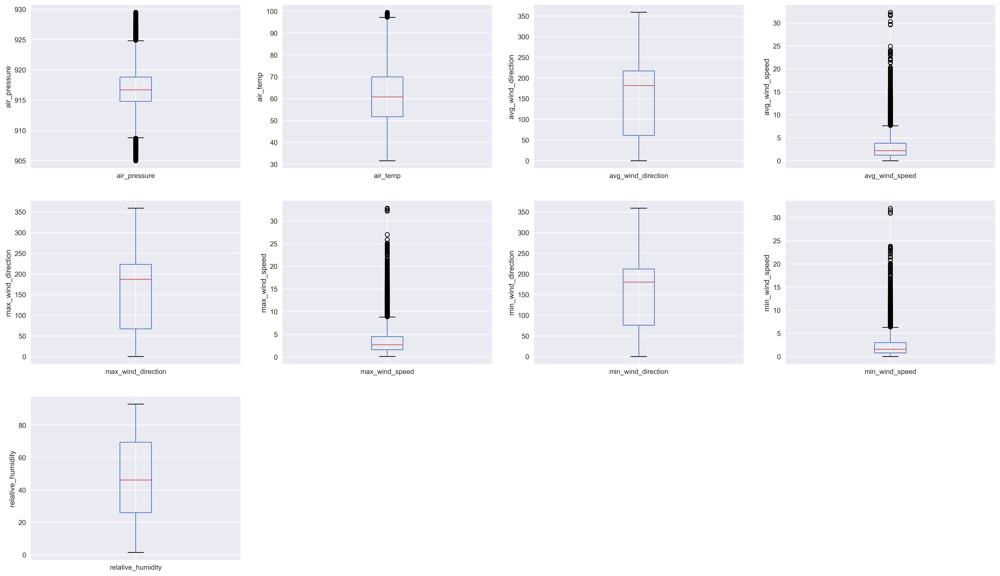

In [26]:
plt.figure(figsize=(25,20), dpi = 300)
plt.style.use('seaborn')
for i in range(len(columns)):
  plt.subplot(4, 4, i+1)
  fig = data1.boxplot(column=columns[i])
  fig.set_title('')
  fig.set_ylabel(columns[i])

> For some attributes , our data is rifed with outliers. For such, we can proceed with $\pm 1.5 * \text{IQR}$ for oultier treatment. Any instance outside this regime is to be considered outliers. The rationale is that this quantity approximates $3\sigma$ which pretty much covers $99.75\%$ of the distrbution

##### Removing outliers by Inter Quartile Range Method (IQR)


```Outlier Treatment by IQR Method```

- Calculating the IQR :  $IQR= Q3 (75 \%ile) -Q1(25 \%ile)$.
- Dropping instances that fall outside [$Q1–1.5*IQR$] and [$Q3+1.5*IQR$].

In [27]:
columns

['air_pressure',
 'air_temp',
 'avg_wind_direction',
 'avg_wind_speed',
 'max_wind_direction',
 'max_wind_speed',
 'min_wind_direction',
 'min_wind_speed',
 'relative_humidity']

In [28]:
data1.describe()

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
count,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06,1.048341e+06
mean,9.168967e+02,6.088583e+01,1.615804e+02,2.749162e+00,1.624848e+02,3.370496e+00,1.670568e+02,2.115689e+00,4.889240e+01
std,3.086172e+00,1.202929e+01,9.582261e+01,2.017669e+00,9.261220e+01,2.364975e+00,9.805484e+01,1.717781e+00,2.602888e+01
min,9.050000e+02,3.164000e+01,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e-01,0.000000e+00,0.000000e+00,1.400000e+00
25%,9.148000e+02,5.180000e+01,6.100000e+01,1.200000e+00,6.700000e+01,1.600000e+00,7.600000e+01,8.000000e-01,2.600000e+01
50%,9.167000e+02,6.080000e+01,1.820000e+02,2.200000e+00,1.870000e+02,2.700000e+00,1.800000e+02,1.600000e+00,4.610000e+01
75%,9.188000e+02,6.998000e+01,2.170000e+02,3.800000e+00,2.230000e+02,4.500000e+00,2.120000e+02,3.000000e+00,6.940000e+01
max,9.295000e+02,9.950000e+01,3.590000e+02,3.230000e+01,3.590000e+02,3.280000e+01,3.590000e+02,3.200000e+01,9.300000e+01


#### <font color = 'aqua'> The above tables already gives us the IQR information for our columns. Now let's automate it

In [30]:
Q1 = data1[columns].quantile(0.25)
Q3 = data1[columns].quantile(0.75)
IQR = Q3 - Q1

pd.concat([Q1, Q3, IQR], axis=1, keys= ['Q1', 'Q3', 'IQR'])

,Q1,Q3,IQR
air_pressure,914.8,918.80,4.00
air_temp,51.8,69.98,18.18
avg_wind_direction,61.0,217.00,156.00
avg_wind_speed,1.2,3.80,2.60
max_wind_direction,67.0,223.00,156.00
max_wind_speed,1.6,4.50,2.90
min_wind_direction,76.0,212.00,136.00
min_wind_speed,0.8,3.00,2.20
relative_humidity,26.0,69.40,43.40


    We have already detected the outliers. Now we are dropping them as per the IQR technique described above.

In [31]:
data2 = data1[~((data1[columns] < (Q1 - 1.5 * IQR)) | (data1[columns] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [34]:
data2.head()

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
0,912.3,64.76,97.0,1.2,106.0,1.6,85.0,1.0,60.5
1,912.3,63.86,161.0,0.8,215.0,1.5,43.0,0.2,39.9
2,912.3,64.22,77.0,0.7,143.0,1.2,324.0,0.3,43.0
3,912.3,64.40,89.0,1.2,112.0,1.6,12.0,0.7,49.5
4,912.3,64.40,185.0,0.4,260.0,1.0,100.0,0.1,58.8


#### Outliers stats after dropping rows using IQR.

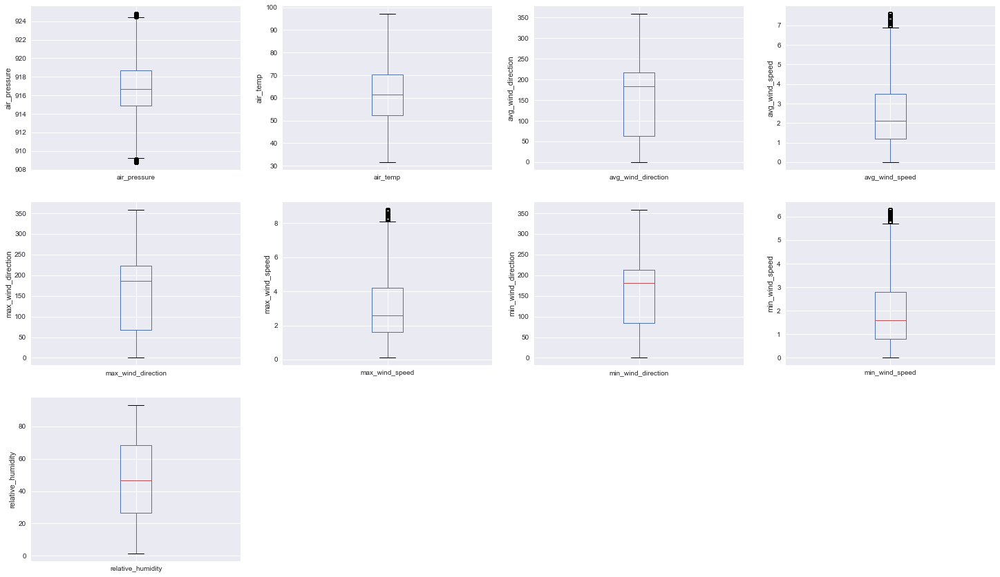

In [38]:
plt.figure(figsize=(25,20))
for i in range(len(columns)):
  plt.subplot(4, 4, i+1)
  fig = data2.boxplot(column=columns[i])
  fig.set_title('')
  fig.set_ylabel(columns[i])

Very well... we are rid of outliers now. Some work huh 🤪

In [39]:
data2.shape

(997652, 9)

In [40]:
data2.sample(4)

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
298651,914.2,60.80,205.0,3.5,210.0,4.0,197.0,3.2,47.1
514712,914.9,90.68,183.0,1.6,200.0,1.8,166.0,1.4,29.4
666346,920.9,72.86,316.0,0.8,13.0,1.2,286.0,0.1,15.8
1028726,916.5,68.36,174.0,4.6,182.0,5.8,168.0,3.6,41.1


<hr> 

### Data Munging is done here. We prcoeed with sampling and split to groom data for ML algorithms

<hr> 

In [41]:
data3=data2.sample(100000)

In [42]:
data3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 220467 to 973064
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   air_pressure        100000 non-null  float64
 1   air_temp            100000 non-null  float64
 2   avg_wind_direction  100000 non-null  float64
 3   avg_wind_speed      100000 non-null  float64
 4   max_wind_direction  100000 non-null  float64
 5   max_wind_speed      100000 non-null  float64
 6   min_wind_direction  100000 non-null  float64
 7   min_wind_speed      100000 non-null  float64
 8   relative_humidity   100000 non-null  float64
dtypes: float64(9)
memory usage: 7.6 MB


# Exploratory Data Analysis (EDA)

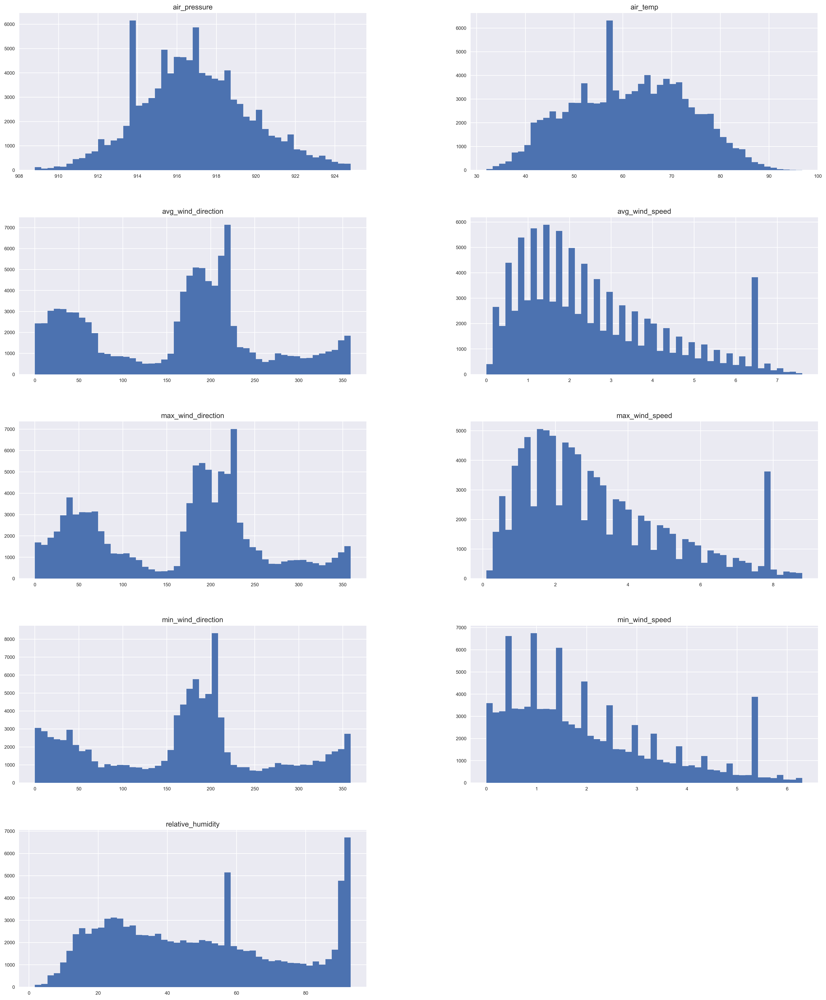

In [52]:
plt.rcParams['figure.dpi'] = 300
data3.hist(figsize=(24, 30),layout=(5,2), bins=50, xlabelsize=8, ylabelsize=8);

### Scatter Plot 

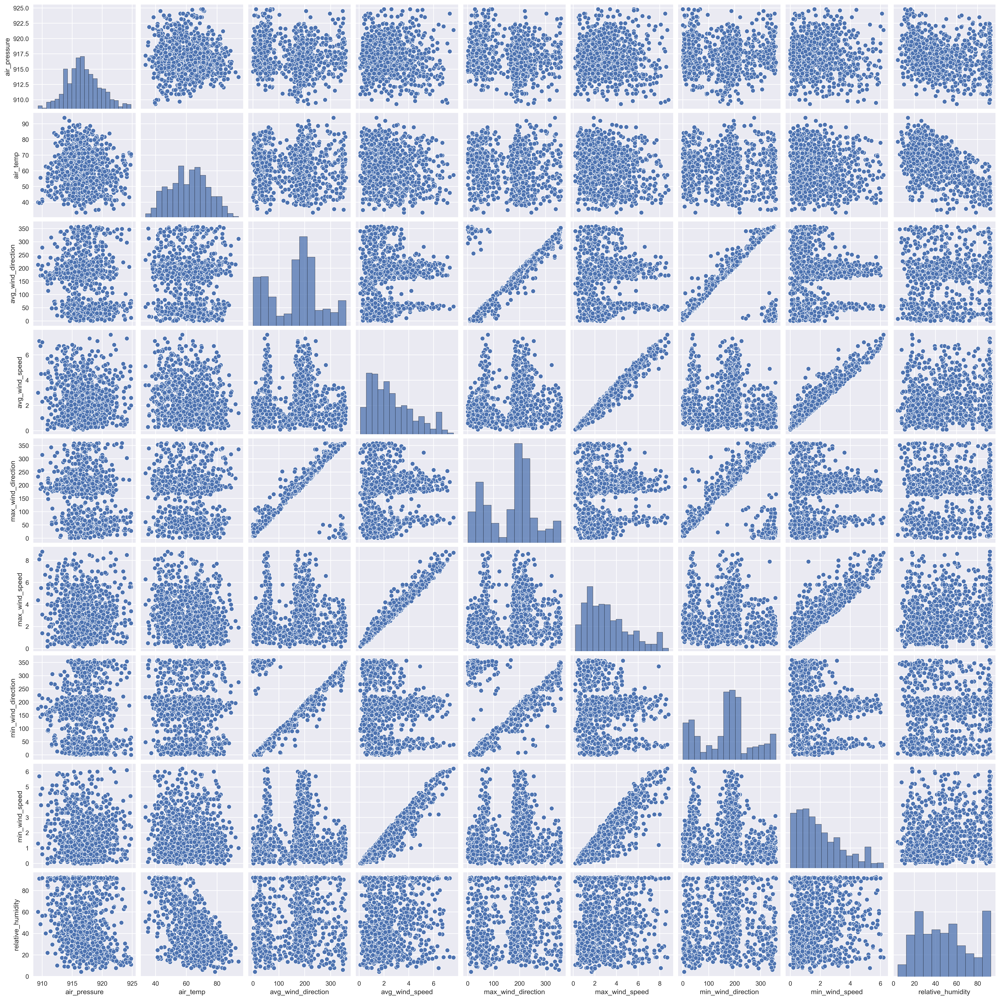

In [53]:
data4=data3.sample(1000)
sns.pairplot(data4)
plt.show()

## Feature scaling by Standardizing Data

In [54]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
data3[columns]=scaler.fit_transform(data3[columns])

In [55]:
data3.head()

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
220467,2.079072,0.217429,1.256562,-1.077434,1.306132,-1.165094,1.149457,-0.848949,-0.963164
943613,-0.918600,-0.793562,-0.523083,-1.311282,0.273759,-1.215312,1.834424,-1.255157,1.620614
833738,1.079848,-0.537042,0.111761,-0.843586,0.155467,-0.964221,0.035107,-0.645846,0.350289
920276,-0.204868,-0.567221,0.028503,-0.083580,0.101697,0.040142,-0.067126,-0.442742,1.103074
953818,-0.240555,1.424582,0.371943,-1.135896,0.478083,-1.215312,0.178235,-0.984352,-1.123915


#### Pearson's R Correlation

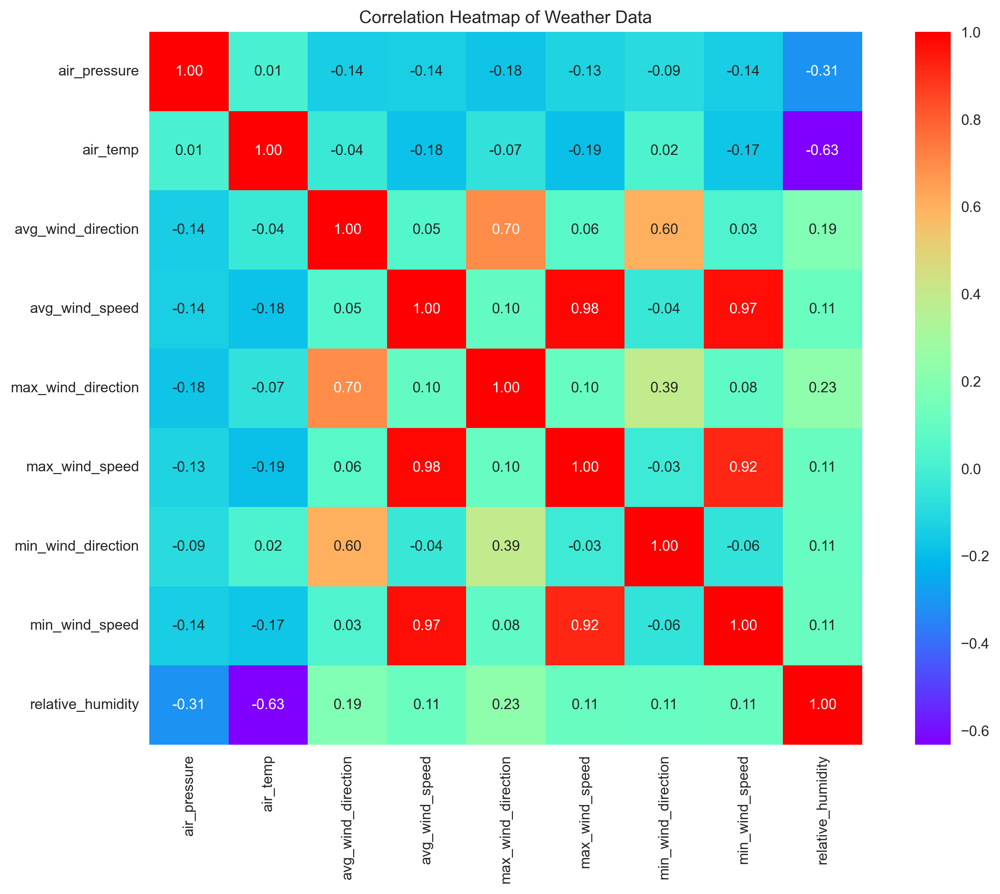

In [67]:
plt.figure(figsize=(13,9), dpi = 300)
plt.title('Correlation Heatmap of Weather Data')
ax = sns.heatmap(data3[columns].corr(), square=True, annot=True, fmt='.2f', linecolor='black', cmap='rainbow')           
plt.show()

## Dimension Reduction with PCA
    Principla Component Analysis (PCA) is an excellent method to reduce dimensionality by taking into account the variability of data with sustained information loss.It does so by creating new uncorrelated variables that successively maximize the variance.

In [72]:
data3.columns

Index(['air_pressure', 'air_temp', 'avg_wind_direction', 'avg_wind_speed',
       'max_wind_direction', 'max_wind_speed', 'min_wind_direction',
       'min_wind_speed', 'relative_humidity'],
      dtype='object')

In [69]:
from sklearn.decomposition import PCA
pca=PCA().fit(data3)
pca_df=pca.transform(data3)

In [70]:
pca.explained_variance_ratio_

array([0.34487499, 0.24998574, 0.16437684, 0.10652244, 0.06606837,
       0.03150495, 0.02725664, 0.00897914, 0.00043089])

#### PCA Captured Variance

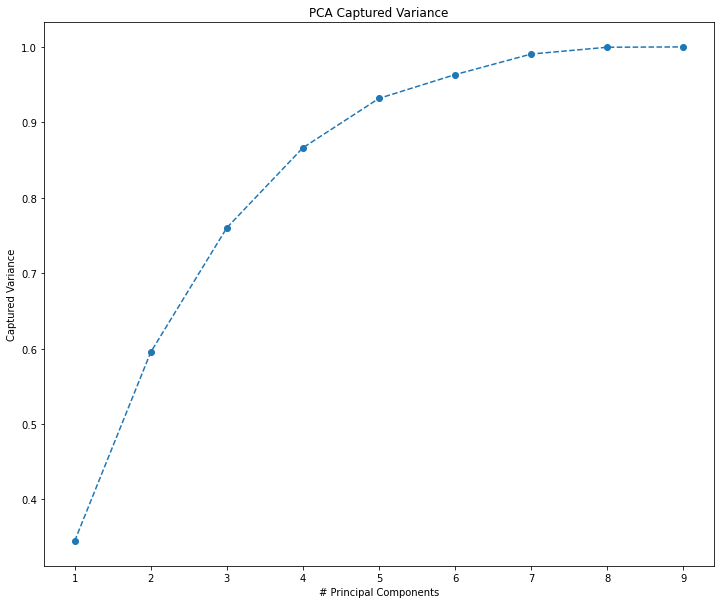

In [28]:
plt.figure(figsize=(12,10))
plt.plot(range(1, 10), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--', )
plt.title('PCA Captured Variance')
plt.xlabel('# Principal Components')
plt.ylabel('Captured Variance')
plt.show()

    Earlier we started with 9 columns and after PCA transformation , we se the first 5 components describing 96% variance of the dataset. The sixth PC and thenafter starts to show a saturation. Safely, with >95% variance, we proceed with 5 principal component

In [73]:
pca = PCA(n_components=5)
pca.fit(data3)
pca.components_

array([[-0.15875412, -0.20583324,  0.13653463,  0.53703075,  0.16752312,
         0.52921132,  0.05133032,  0.52269859,  0.20349162],
       [ 0.17832169,  0.09423907, -0.55763391,  0.18036323, -0.5016665 ,
         0.16962299, -0.48099645,  0.18951198, -0.26099864],
       [-0.13183657, -0.64107487, -0.2252081 , -0.13433956, -0.15695484,
        -0.13514321, -0.23604154, -0.12780667,  0.62283839],
       [ 0.91082388, -0.35998749,  0.1210954 ,  0.03298154,  0.05443782,
         0.04694528,  0.13101584,  0.01134999, -0.05094779],
       [-0.07957002, -0.05393742, -0.11388907,  0.03026959, -0.62741091,
         0.03977696,  0.76134743,  0.02482751,  0.0371407 ]])

##### Reverting back to the DataFrame

In [74]:
data_pca = pd.DataFrame(data = pca.components_,
                           columns = data3.columns.values,
                           index = ['Component 1', 'Component 2', 'Component 3', 'Component 4', 'Component 5'])
data_pca

,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,relative_humidity
Component 1,-0.158754,-0.205833,0.136535,0.537031,0.167523,0.529211,0.051330,0.522699,0.203492
Component 2,0.178322,0.094239,-0.557634,0.180363,-0.501666,0.169623,-0.480996,0.189512,-0.260999
Component 3,-0.131837,-0.641075,-0.225208,-0.134340,-0.156955,-0.135143,-0.236042,-0.127807,0.622838
Component 4,0.910824,-0.359987,0.121095,0.032982,0.054438,0.046945,0.131016,0.011350,-0.050948
Component 5,-0.079570,-0.053937,-0.113889,0.030270,-0.627411,0.039777,0.761347,0.024828,0.037141


#### Scatter plot of chosen Principal Comoponents

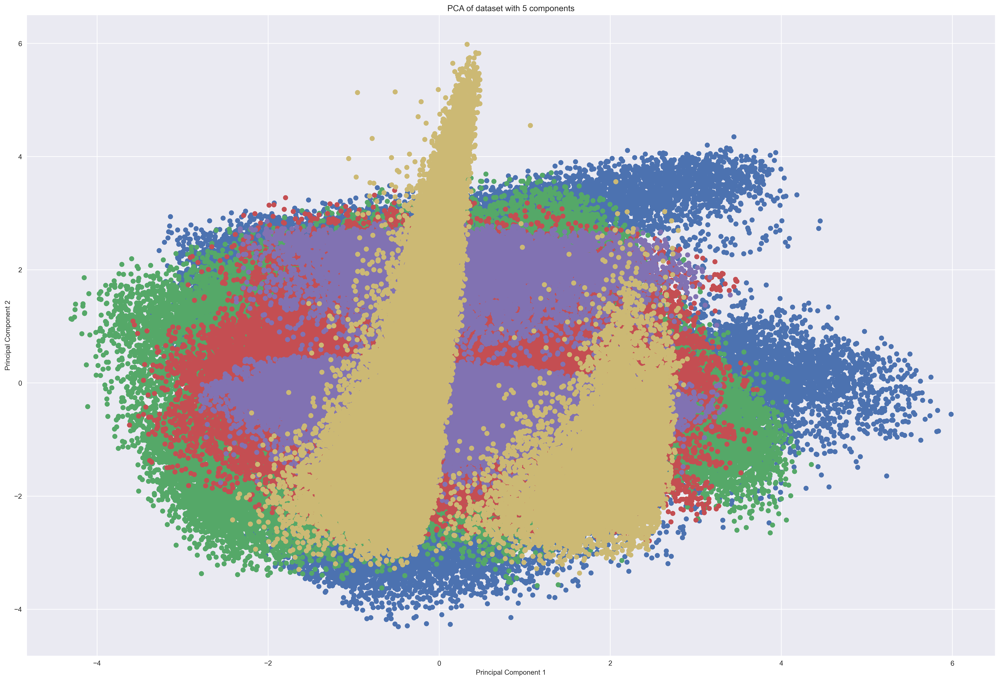

In [77]:
plt.figure(figsize=(25,17))
plt.xlabel("Principal Component 1",fontsize=10)
plt.ylabel("Principal Component 2",fontsize=10)
plt.title("PCA of dataset with 5 components")
plt.scatter(pca_df[:,0],pca_df[:,1])
plt.scatter(pca_df[:,1],pca_df[:,2])
plt.scatter(pca_df[:,2],pca_df[:,3])
plt.scatter(pca_df[:,3],pca_df[:,4])
plt.scatter(pca_df[:,4],pca_df[:,0])
plt.show()

### HeatMap of the components 

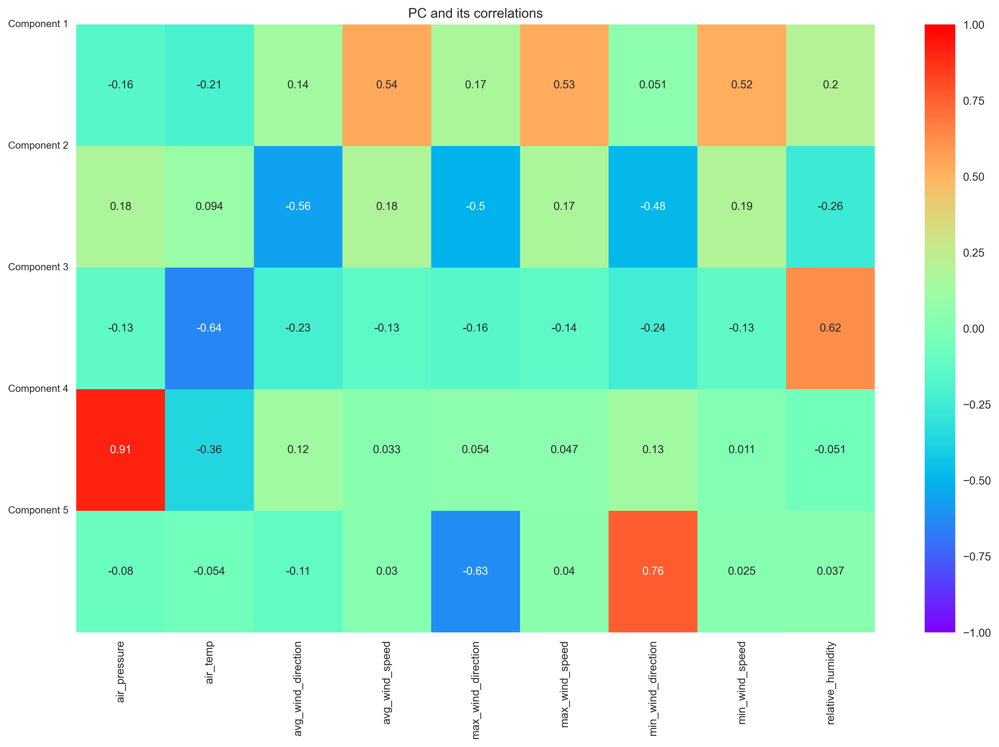

In [78]:
plt.figure(figsize=(16,10))
sns.heatmap(data_pca, vmin=-1, vmax=1, cmap='rainbow', annot=True)
plt.title('PC and its correlations')
plt.yticks([0, 1, 2, 3, 4], ['Component 1', 'Component 2', 'Component 3', 'Component 4', 'Component 5'],rotation=0, fontsize=9)
plt.show()

In [81]:
pca_scores = pca.transform(data3)
pca_scores

array([[-1.76037846, -1.81905277, -1.3619947 ,  2.13846531, -0.40042086],
       [-1.29586654, -2.0700866 ,  1.78186852, -0.55622571,  1.34133833],
       [-1.24739384, -0.54477724,  0.68841495,  1.10521139, -0.20741132],
       ...,
       [-1.6272877 , -1.18795854, -0.31207194,  0.83623419, -0.6071265 ],
       [ 2.20304585, -0.05383423, -0.734124  , -0.55782319, -0.07690279],
       [ 0.71368774, -1.54338055,  0.20243493, -0.43200543, -0.07977541]])

In [82]:
# pca_scores = pca.transform(data1)
# pca_scores

In [83]:
data_pca1 = pd.DataFrame(data = pca_scores)
data_pca1

,0,1,2,3,4
0,-1.760378,-1.819053,-1.361995,2.138465,-0.400421
1,-1.295867,-2.070087,1.781869,-0.556226,1.341338
2,-1.247394,-0.544777,0.688415,1.105211,-0.207411
3,0.136164,-0.504683,1.133529,-0.044310,-0.042219
4,-2.111410,-0.745847,-1.339796,-0.685945,-0.413220
...,...,...,...,...,...
99995,0.754812,-0.410798,-1.046465,-0.454049,-0.115990
99996,4.538002,-0.000318,0.124808,-0.413727,0.265642
99997,-1.627288,-1.187959,-0.312072,0.836234,-0.607126
99998,2.203046,-0.053834,-0.734124,-0.557823,-0.076903


In [84]:
# data_pca1 = pd.DataFrame(data = pca_scores)
# data_pca1

In [85]:
pca_scores.shape

(100000, 5)

#### Within Cluster Sum of Squares (WCSS)

In [36]:
wcss = []
for i in range(1, 10):
    kmeans_pca = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans_pca.fit(pca_scores)
    wcss.append(kmeans_pca.inertia_)

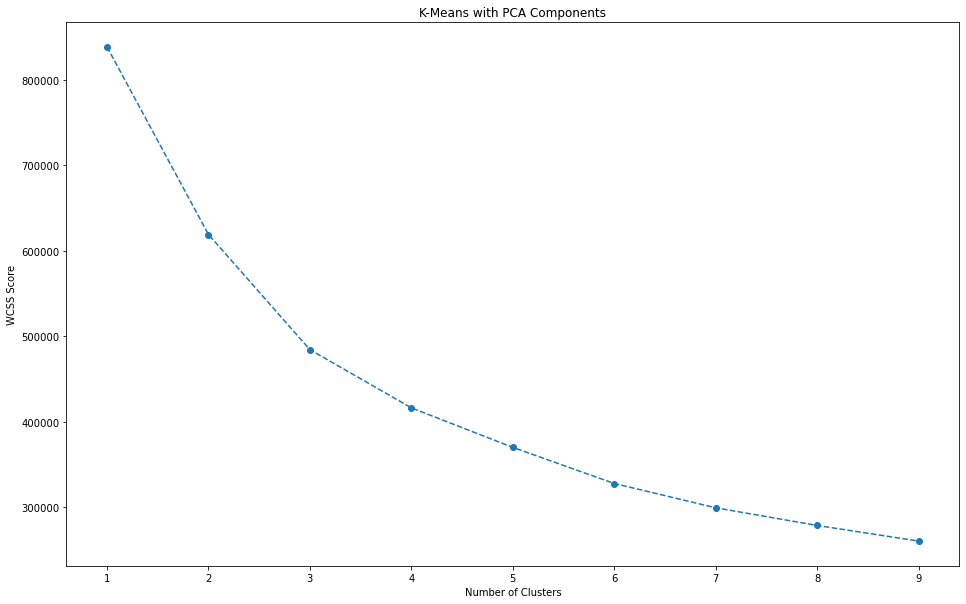

In [37]:
plt.figure(figsize=(16,10))
plt.plot(range(1, 10), wcss, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS Score')
plt.title('K-Means with PCA Components')
plt.show()

In [38]:
kmeans_pca = KMeans(n_clusters=3, init='k-means++', random_state=3)
kmeans_pca.fit(pca_scores)

KMeans(n_clusters=3, random_state=3)

### Bi - Plot
    From the bi-plot above,the variables which seems closer to one another can be assumed to form a cluster.

C:\Users\Shivam\AppData\Local\Temp/ipykernel_7248/3917602245.py:7: RuntimeWarning: divide by zero encountered in double_scalars
  scalex=1.0/(xs.max()-xs.max())
C:\Users\Shivam\AppData\Local\Temp/ipykernel_7248/3917602245.py:8: RuntimeWarning: divide by zero encountered in double_scalars
  scaley=1.0/(xs.min()-xs.min())


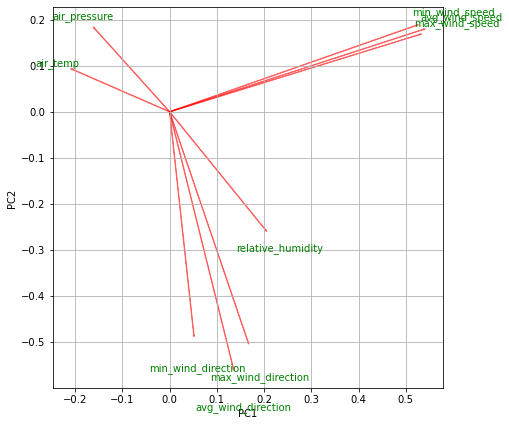

In [39]:
plt.figure(figsize=(7,7))
def myplot(score,coeff,labels=None):
    xs=score[:,0]
    ys=score[:,1]
    n=coeff.shape[0]
    scalex=1.0/(xs.max()-xs.max())
    scaley=1.0/(xs.min()-xs.min())
    plt.scatter(xs*scalex,ys*scaley,s=5)
    for i in range(n):
        plt.arrow(0,0,coeff[i,0],coeff[i,1],color="r", alpha=0.5)
        if labels is None:
            plt.text(coeff[i,0]*1.15,coeff[i,1]*1.15,"Var"+str(i+1),color="green", ha="center", va="center")
        else:
            plt.text(coeff[i,0]*1.15,coeff[i,1]*1.15,labels[i],color="green", ha="center", va="center")
            
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    
    plt.grid()
    
myplot(pca_df[:,0:3],np.transpose(pca.components_[0:2, :]),list(data3.columns))
plt.show()
          

```
- avg_wind_direction, min_wind_direction, max_wind_direction,relative_humidity tend to form one clusters.
- min_wind_speed, max_wind_speed, avg_wind_speed tend to form another cluster.
- air_temp, air_pressure tend to form yet another cluster.
```

<!-- # K Means Clustering
It is an iterative algorithm that divides the unlabeled data set into k different clusters in such a way that each data set belongs only one group that has similar properties -->

# Elbow Method
Our inflection point comes out as `k=3`

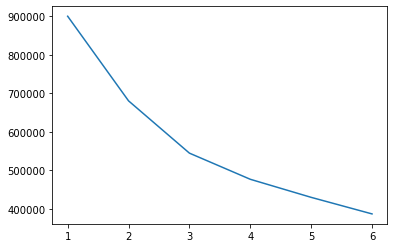

In [40]:
#k means
from sklearn.cluster import KMeans
SSE=[]
for i in range (1,7):
    Kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    Kmeans.fit(pca_df)
    SSE.append(Kmeans.inertia_)
plt.plot(range (1,7),SSE)
plt.show()

As the graph become linear after the k value 3, so we take the value of k as 3.

In [41]:
Kmeans3=KMeans(n_clusters=3,init='k-means++',random_state=42).fit(pca_df)
y_kmeans3=Kmeans3.fit_predict(pca_df)

### K Means Clustering

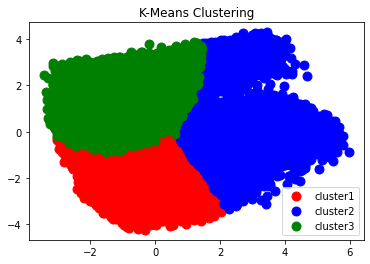

In [43]:
plt.scatter(pca_df[y_kmeans3==0,0],pca_df[y_kmeans3==0,1],s=80,c='red',label='cluster1')
plt.scatter(pca_df[y_kmeans3==1,0],pca_df[y_kmeans3==1,1],s=80,c='blue',label='cluster2')
plt.scatter(pca_df[y_kmeans3==2,0],pca_df[y_kmeans3==2,1],s=80,c='green',label='cluster3')
plt.title("K-Means Clustering")
plt.legend()
plt.show()

### Silhoutte Score for K-Means Clustering

In [42]:
from sklearn.metrics import silhouette_score

In [44]:
 print(f'Silhouette Score("n clusters=3"); {silhouette_score(pca_df,y_kmeans3)}')

Silhouette Score("n clusters=3"); 0.23928847444779844


# Agglomerative Hierarchical Clustering
Agglomerative Hierarchical Clustering (AHC) is a clustering (or classification) method which has the following advantages:

It works from the dissimilarities between the objects to be grouped together. A type of dissimilarity can be suited to the subject studied and the nature of the data.<br>
One of the results is the dendrogram which shows the progressive grouping of the data. It is then possible to gain an idea of a suitable number of classes into which the data can be grouped.

In [45]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA, FactorAnalysis
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering 
from sklearn.neighbors import LocalOutlierFactor
from sklearn import preprocessing

In [46]:
clf = LocalOutlierFactor(n_neighbors=2)
data1['Outlier']=clf.fit_predict(data1)
data1=data1[data1['Outlier']==1]
data1.drop(['Outlier'], axis=1, inplace = True)
data1.reset_index(drop =True,inplace=True)

In [87]:
data5=data3.sample(10000)

### Forming a Dendogram
A dendrogram is a tree-like diagram that records the sequences of merges or splits.


In [48]:
hier_cluster = linkage(data5, method='ward')

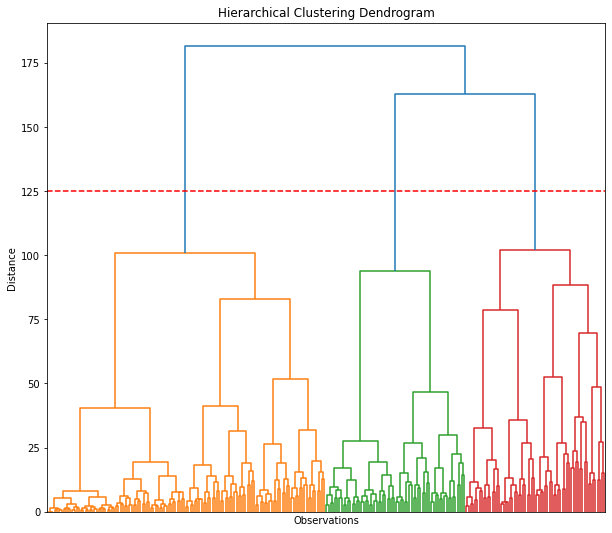

In [49]:
plt.figure(figsize=(10,9))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Observations')
plt.ylabel('Distance')
dendrogram(hier_cluster, truncate_mode='level', p = 7, show_leaf_counts=False, no_labels=True)
plt.axhline(y=125
            ,color='red',linestyle='--') 
plt.show()

The number of clusters will be the number of vertical lines which are being intersected by the line drawn using the threshold.
<br> We can set a threshold distance and draw a horizontal line (Generally, we try to set the threshold in such a way that it cuts the tallest vertical line).

In [50]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(data5)
kmeans.labels_

array([1, 0, 1, ..., 0, 0, 0])

In [88]:
data5.columns

Index(['air_pressure', 'air_temp', 'avg_wind_direction', 'avg_wind_speed',
       'max_wind_direction', 'max_wind_speed', 'min_wind_direction',
       'min_wind_speed', 'relative_humidity'],
      dtype='object')

## Agglomerative Hierarchical Clusters for different values of n

In [52]:
from sklearn.preprocessing import StandardScaler, normalize
data6=data.sample(10000)
# Scaling the data so that all the features become comparable
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data6)
  
# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
X_normalized = normalize(X_scaled)
  
# Converting the numpy array into a pandas DataFrame
X_normalized = pd.DataFrame(X_normalized)

In [53]:
data_pca2=data_pca1.sample(10000)
pca = PCA(n_components = 2)
X_principal = pca.fit_transform(X_normalized)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']

### For 2 clusters

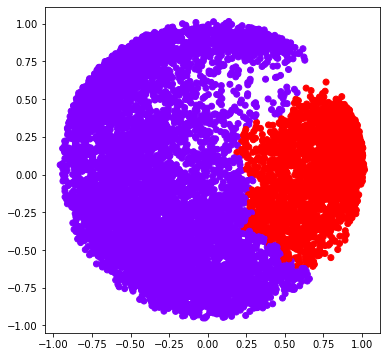

In [54]:

ac2 = AgglomerativeClustering(n_clusters = 2)
  
# Visualizing the clustering
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'], 
           c = ac2.fit_predict(X_principal), cmap ='rainbow')
plt.show()

### For 3 clusters

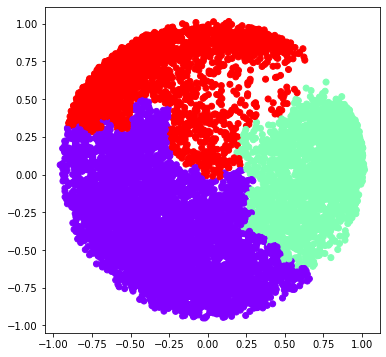

In [55]:
ac3 = AgglomerativeClustering(n_clusters = 3)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
           c = ac3.fit_predict(X_principal), cmap ='rainbow')
plt.show()

### For 4 clusters

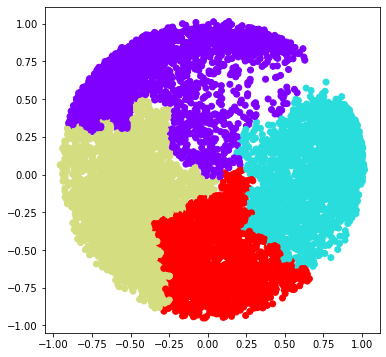

In [56]:
ac4 = AgglomerativeClustering(n_clusters = 4)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac4.fit_predict(X_principal), cmap ='rainbow')
plt.show()

### For 5 clusters

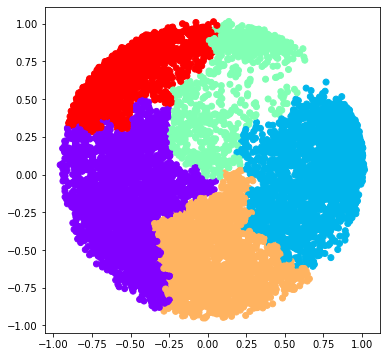

In [57]:
ac5 = AgglomerativeClustering(n_clusters = 5)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac5.fit_predict(X_principal), cmap ='rainbow')
plt.show()

### For 6 clusters

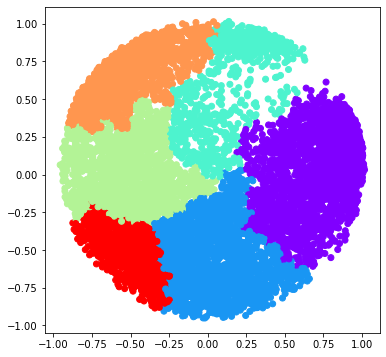

In [58]:
ac6 = AgglomerativeClustering(n_clusters = 6)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac6.fit_predict(X_principal), cmap ='rainbow')
plt.show()

### At last comparing the silhouette scores of the different clusters formed by Agglomerative Clustering

In [60]:
k = [2, 3, 4, 5, 6]
  
# Appending the silhouette scores of the different models to the list
silhouette_scores = []
silhouette_scores.append(silhouette_score(X_principal, ac2.fit_predict(X_principal)))
silhouette_scores.append(silhouette_score(X_principal, ac3.fit_predict(X_principal)))
silhouette_scores.append(silhouette_score(X_principal, ac4.fit_predict(X_principal)))
silhouette_scores.append(silhouette_score(X_principal, ac5.fit_predict(X_principal)))
silhouette_scores.append(silhouette_score(X_principal, ac6.fit_predict(X_principal)))

In [61]:
silhouette_scores

[0.39247113129668343,
 0.4412222035866001,
 0.3987856746011082,
 0.3865714973842491,
 0.36942332722199556]

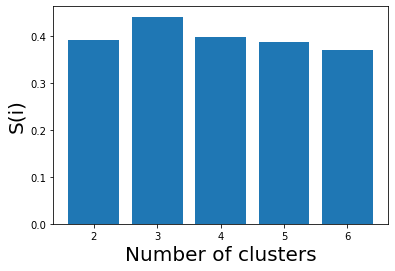

In [62]:
# Plotting a bar graph to compare the results
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 20)
plt.ylabel('S(i)', fontsize = 20)
plt.show()

silhouette score for three number of clusters is maximum.